# Texture Mixing with Wasserstein Barycenters

Demonstrating first-order and higher-order statistical texture mixing using sliced Wasserstein distances.

## Setup

In [1]:
import numpy as np
import torch
import cv2 as cv
import matplotlib.pyplot as plt
import os
import sys

# Add src to path
sys.path.insert(0, os.path.abspath('..'))

from src.first_order_statistical_mixing import first_order_texture_mixing
from src.higher_order_statistical_mixing import higher_order_texture_mixing
from src.utils import read_texture, ColorSpace


# Setup device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


## Load Textures

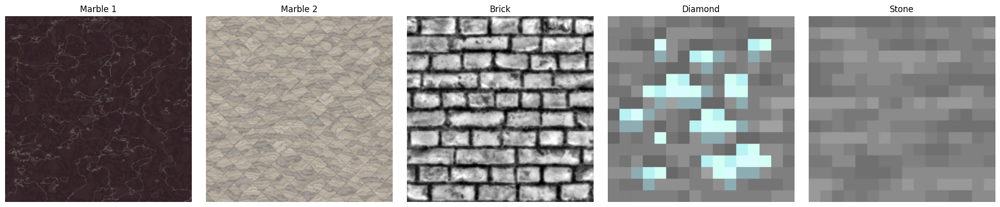

In [2]:
# Load textures
marble_1 = read_texture("../assets/marble_1.png")
marble_2 = read_texture("../assets/marble_2.png")
brick = read_texture("../assets/brick.png")
diamond = read_texture("../assets/diamond.png")
stone = read_texture("../assets/stone.png")

# Display
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for ax, (name, tex) in zip(axes, [("Marble 1", marble_1), ("Marble 2", marble_2), 
                                    ("Brick", brick), ("Diamond", diamond), ("Stone", stone)]):
    ax.imshow(tex)
    ax.set_title(name)
    ax.axis('off')
plt.tight_layout()
plt.show()

## Experiment 1: Marble 50/50 Mix (First-Order)

In [ ]:
result_50_50 = first_order_texture_mixing(
    [marble_1, marble_2], 
    np.array([0.5, 0.5]),
    device=device,
    verbose=True
)

# Save result
output_dir = "../output/experiment_1_marble_50_50"
os.makedirs(output_dir, exist_ok=True)
cv.imwrite(f"{output_dir}/marble_1_input.png", cv.cvtColor(marble_1, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/marble_2_input.png", cv.cvtColor(marble_2, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/result_50_50_mix.png", cv.cvtColor(result_50_50, cv.COLOR_RGB2BGR))
print(f"Results saved to {output_dir}")

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(marble_1)
axes[0].set_title("Marble 1")
axes[0].axis('off')
axes[1].imshow(result_50_50)
axes[1].set_title("50/50 Mix")
axes[1].axis('off')
axes[2].imshow(marble_2)
axes[2].set_title("Marble 2")
axes[2].axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/comparison.png", dpi=150, bbox_inches='tight')
plt.show()

## Experiment 2: Marble Interpolation Sequence (First-Order)

Generate interpolations from Marble 1 to Marble 2 in steps of 0.1

Generating 5 interpolations...
[1/5] ρ = 0.0
Mixing in LAB color space
Mixing channels: ['L']
Computing steerable pyramids for 2 textures of size 256x256...
  Pyramid decomposition complete (0.05s)
  14 total subbands (12 oriented bands)

Computing coefficient barycenters on GPU...
Mixing in LAB color space
Mixing channels: ['L']
Computing steerable pyramids for 2 textures of size 256x256...
  Pyramid decomposition complete (0.05s)
  14 total subbands (12 oriented bands)

Computing coefficient barycenters on GPU...
  Processed 5/12 oriented subbands
  Processed 5/12 oriented subbands
  Processed 10/12 oriented subbands
  Processed 10/12 oriented subbands
  Coefficient barycenters complete (77.90s)

Computing pixel barycenter on GPU...
  Coefficient barycenters complete (77.90s)

Computing pixel barycenter on GPU...
  Pixel barycenter complete (8.09s)

Starting iterative synthesis (100 iterations)...
  Pixel barycenter complete (8.09s)

Starting iterative synthesis (100 iterations)...
 

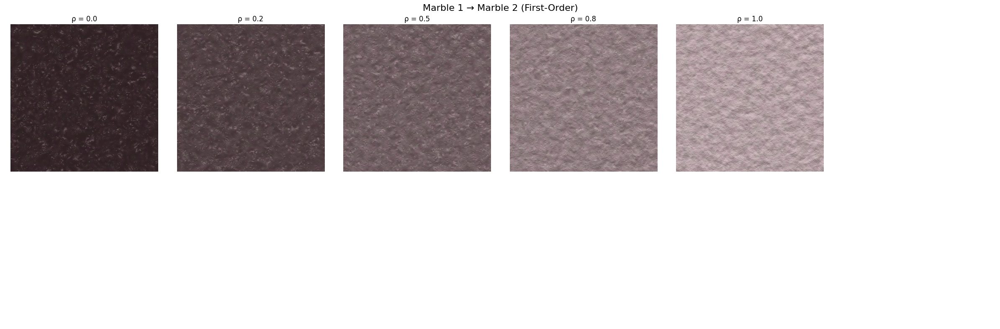

All results saved to ../output/experiment_2_marble_interpolation


In [3]:
rhos_list = np.arange(0.0, 1.1, 0.25)
marble_interp_results = []

# Create output directory
output_dir = "../output/experiment_2_marble_interpolation"
os.makedirs(output_dir, exist_ok=True)

print(f"Generating {len(rhos_list)} interpolations...")
for i, rho in enumerate(rhos_list):
    print(f"[{i+1}/{len(rhos_list)}] ρ = {rho:.1f}")
    result = first_order_texture_mixing(
        [marble_1, marble_2],
        np.array([1-rho, rho]),
        color_space=ColorSpace.LAB,
        device=device,
        verbose=True
    )
    marble_interp_results.append(result)
    
    # Save individual result
    cv.imwrite(f"{output_dir}/interpolation_rho_{rho:.1f}.png", cv.cvtColor(result, cv.COLOR_RGB2BGR))

# Save input textures
cv.imwrite(f"{output_dir}/marble_1_input.png", cv.cvtColor(marble_1, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/marble_2_input.png", cv.cvtColor(marble_2, cv.COLOR_RGB2BGR))

# Display grid
fig, axes = plt.subplots(2, 6, figsize=(24, 8))
axes = axes.flatten()
for i, (rho, result) in enumerate(zip(rhos_list, marble_interp_results)):
    axes[i].imshow(result)
    axes[i].set_title(f"ρ = {rho:.1f}")
    axes[i].axis('off')
for i in range(len(rhos_list), len(axes)):
    axes[i].axis('off')
plt.suptitle("Marble 1 → Marble 2 (First-Order)", fontsize=16)
plt.tight_layout()
plt.savefig(f"{output_dir}/interpolation_grid.png", dpi=150, bbox_inches='tight')
plt.show()

print(f"All results saved to {output_dir}")

## Experiment 3: Marble ↔ Brick (First-Order)

Test first-order mixing with two cases: pure brick reconstruction (1.0) and 50/50 blend. **Expected to fail** at capturing brick structure.

Mixing in LAB color space
Mixing channels: ['L']
Computing steerable pyramids for 2 textures of size 256x256...
  Pyramid decomposition complete (0.09s)
  14 total subbands (12 oriented bands)

Computing coefficient barycenters on GPU...
  Processed 5/12 oriented subbands
  Processed 10/12 oriented subbands
  Coefficient barycenters complete (96.20s)

Computing pixel barycenter on GPU...
  Pixel barycenter complete (9.72s)

Starting iterative synthesis (100 iterations)...
  Iteration 1/100 complete (20.65s)
  Iteration 2/100 complete (20.28s)
  Iteration 3/100 complete (19.81s)
  Iteration 4/100 complete (19.97s)
  Iteration 5/100 complete (20.43s)
  Iteration 6/100 complete (151.37s)
  Iteration 7/100 complete (22.74s)
  Iteration 8/100 complete (20.39s)
  Iteration 9/100 complete (21.28s)
  Iteration 10/100 complete (21.13s)
  Iteration 11/100 complete (31.83s)
  Iteration 12/100 complete (23.06s)
  Iteration 13/100 complete (19.80s)
  Iteration 14/100 complete (19.83s)
  Iteration 1

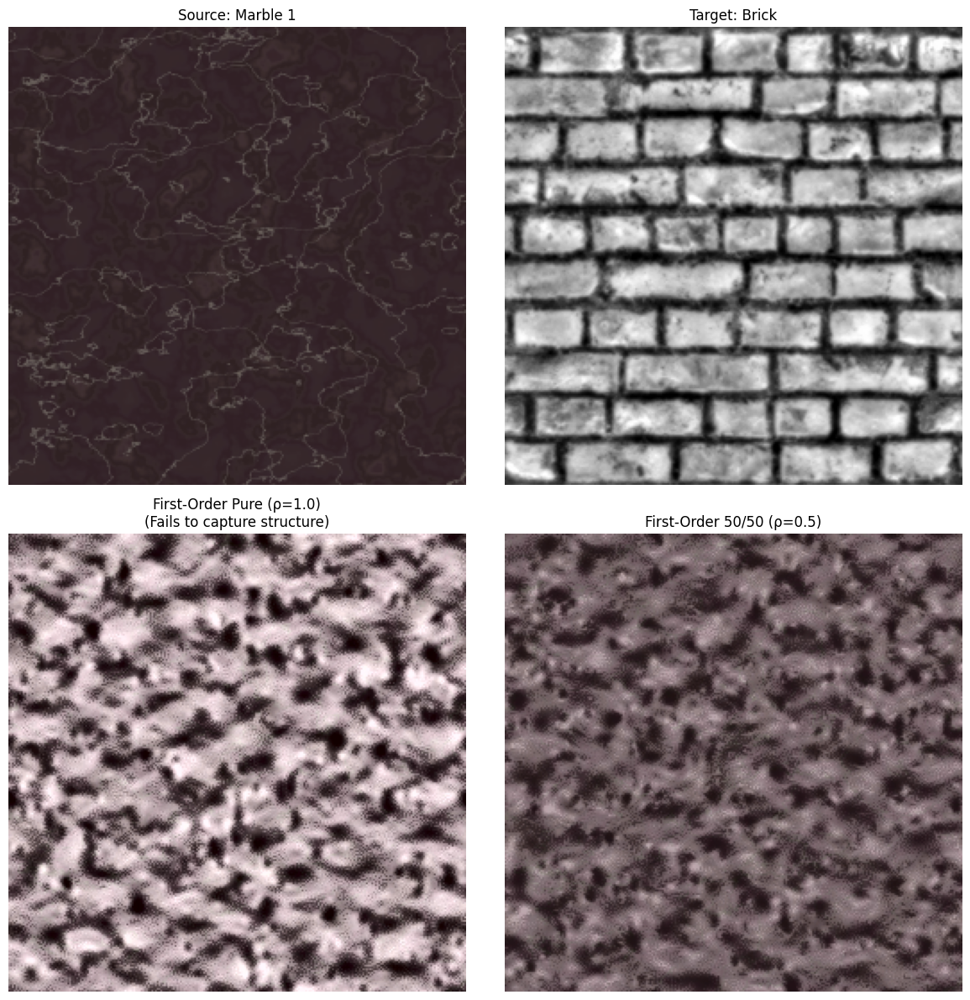

In [3]:
# Case 1: Pure brick (1.0)
marble_to_brick_first_pure = first_order_texture_mixing(
    [marble_1, brick],
    np.array([0.0, 1.0]),
    device=device,
    color_space=ColorSpace.LAB,
    verbose=True
)

# Case 2: 50/50 blend
marble_to_brick_first_50 = first_order_texture_mixing(
    [marble_1, brick],
    np.array([0.5, 0.5]),
    device=device,
    color_space=ColorSpace.LAB,
    verbose=True
)

# Save results
output_dir = "../output/experiment_3_marble_to_brick_first_order"
os.makedirs(output_dir, exist_ok=True)
cv.imwrite(f"{output_dir}/marble_1_source.png", cv.cvtColor(marble_1, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/brick_target.png", cv.cvtColor(brick, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/first_order_pure_brick.png", cv.cvtColor(marble_to_brick_first_pure, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/first_order_50_50.png", cv.cvtColor(marble_to_brick_first_50, cv.COLOR_RGB2BGR))
print(f"Results saved to {output_dir}")

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes[0, 0].imshow(marble_1)
axes[0, 0].set_title("Source: Marble 1")
axes[0, 0].axis('off')
axes[0, 1].imshow(brick)
axes[0, 1].set_title("Target: Brick")
axes[0, 1].axis('off')
axes[1, 0].imshow(marble_to_brick_first_pure)
axes[1, 0].set_title("First-Order Pure (ρ=1.0)\n(Fails to capture structure)")
axes[1, 0].axis('off')
axes[1, 1].imshow(marble_to_brick_first_50)
axes[1, 1].set_title("First-Order 50/50 (ρ=0.5)")
axes[1, 1].axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/comparison.png", dpi=150, bbox_inches='tight')
plt.show()

## Experiment 4: Marble ↔ Brick (Higher-Order)

Now use higher-order mixing which captures spatial correlations. **Expected to succeed**. Test pure brick (1.0) and 50/50 blend.

In [4]:
# Case 1: Pure brick (1.0)
marble_to_brick_higher_pure = higher_order_texture_mixing(
    [marble_1, brick],
    np.array([0.0, 1.0]),
    device=device,
    block_size=4,
    color_space=ColorSpace.LAB,
    verbose=True
)


Mixing in LAB color space
Block size: 4x4
Mixing channels: ['L']
Computing steerable pyramids for 2 textures of size 256x256...
  Pyramid decomposition complete (0.09s)
  14 total subbands (12 oriented bands)

Computing first-order barycenters on GPU...
  Processed 5/12 first-order barycenters
  Processed 10/12 first-order barycenters
  First-order barycenters complete (52.74s)

Computing joint distribution barycenters (block_size=4x4) on GPU...


IndexError: list index out of range

In [ ]:

# Case 2: 50/50 blend
marble_to_brick_higher_50 = higher_order_texture_mixing(
    [marble_1, brick],
    np.array([0.5, 0.5]),
    device=device,
    block_size=4,
    color_space=ColorSpace.LAB,
    verbose=True
)

# Save results
output_dir = "../output/experiment_4_marble_to_brick_higher_order"
os.makedirs(output_dir, exist_ok=True)
cv.imwrite(f"{output_dir}/marble_1_source.png", cv.cvtColor(marble_1, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/brick_target.png", cv.cvtColor(brick, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/first_order_pure_brick.png", cv.cvtColor(marble_to_brick_first_pure, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/first_order_50_50.png", cv.cvtColor(marble_to_brick_first_50, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/higher_order_pure_brick.png", cv.cvtColor(marble_to_brick_higher_pure, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/higher_order_50_50.png", cv.cvtColor(marble_to_brick_higher_50, cv.COLOR_RGB2BGR))
print(f"Results saved to {output_dir}")

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes[0, 0].imshow(marble_1)
axes[0, 0].set_title("Source: Marble 1")
axes[0, 0].axis('off')
axes[0, 1].imshow(marble_to_brick_first_pure)
axes[0, 1].set_title("First-Order Pure (ρ=1.0)\n(Failed)")
axes[0, 1].axis('off')
axes[0, 2].imshow(marble_to_brick_higher_pure)
axes[0, 2].set_title("Higher-Order Pure (ρ=1.0)\n(Success!)")
axes[0, 2].axis('off')
axes[1, 0].imshow(brick)
axes[1, 0].set_title("Target: Brick")
axes[1, 0].axis('off')
axes[1, 1].imshow(marble_to_brick_first_50)
axes[1, 1].set_title("First-Order 50/50")
axes[1, 1].axis('off')
axes[1, 2].imshow(marble_to_brick_higher_50)
axes[1, 2].set_title("Higher-Order 50/50")
axes[1, 2].axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/comparison_all_methods.png", dpi=150, bbox_inches='tight')
plt.show()

## Experiment 5: Diamond ↔ Stone Comparison

Test both first-order and higher-order on diamond/stone textures. Two cases: pure stone (1.0) and 50/50 blend.

First-Order: Diamond → Stone (Pure)
First-Order: Diamond ↔ Stone (50/50)
First-Order: Diamond ↔ Stone (50/50)
First-order results saved to ../output/experiment_5_diamond_to_stone_comparison
First-order results saved to ../output/experiment_5_diamond_to_stone_comparison


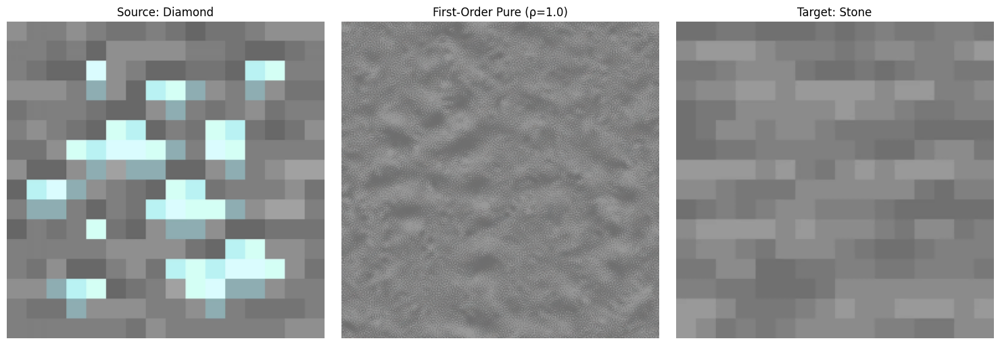

In [8]:
# First-Order: Pure stone (1.0)
print("First-Order: Diamond → Stone (Pure)")
diamond_stone_first_pure = first_order_texture_mixing(
    [diamond, stone],
    np.array([0.0, 1.0]),
    device=device,
    verbose=False
)

# First-Order: 50/50 blend
print("First-Order: Diamond ↔ Stone (50/50)")
diamond_stone_first_50 = first_order_texture_mixing(
    [diamond, stone],
    np.array([0.5, 0.5]),
    device=device,
    verbose=False
)

# Save first-order results only
output_dir = "../output/experiment_5_diamond_to_stone_comparison"
os.makedirs(output_dir, exist_ok=True)
cv.imwrite(f"{output_dir}/diamond_source.png", cv.cvtColor(diamond, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/stone_target.png", cv.cvtColor(stone, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/first_order_pure_stone.png", cv.cvtColor(diamond_stone_first_pure, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/first_order_50_50.png", cv.cvtColor(diamond_stone_first_50, cv.COLOR_RGB2BGR))
print(f"First-order results saved to {output_dir}")

# Display first-order results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(diamond)
axes[0].set_title("Source: Diamond")
axes[0].axis('off')
axes[1].imshow(diamond_stone_first_pure)
axes[1].set_title("First-Order Pure (ρ=1.0)")
axes[1].axis('off')
axes[2].imshow(stone)
axes[2].set_title("Target: Stone")
axes[2].axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/first_order_comparison.png", dpi=150, bbox_inches='tight')
plt.show()


Higher-Order: Diamond → Stone (Pure)
Higher-Order: Diamond ↔ Stone (50/50)
Higher-Order: Diamond ↔ Stone (50/50)
Higher-order results saved to ../output/experiment_5_diamond_to_stone_comparison
Higher-order results saved to ../output/experiment_5_diamond_to_stone_comparison


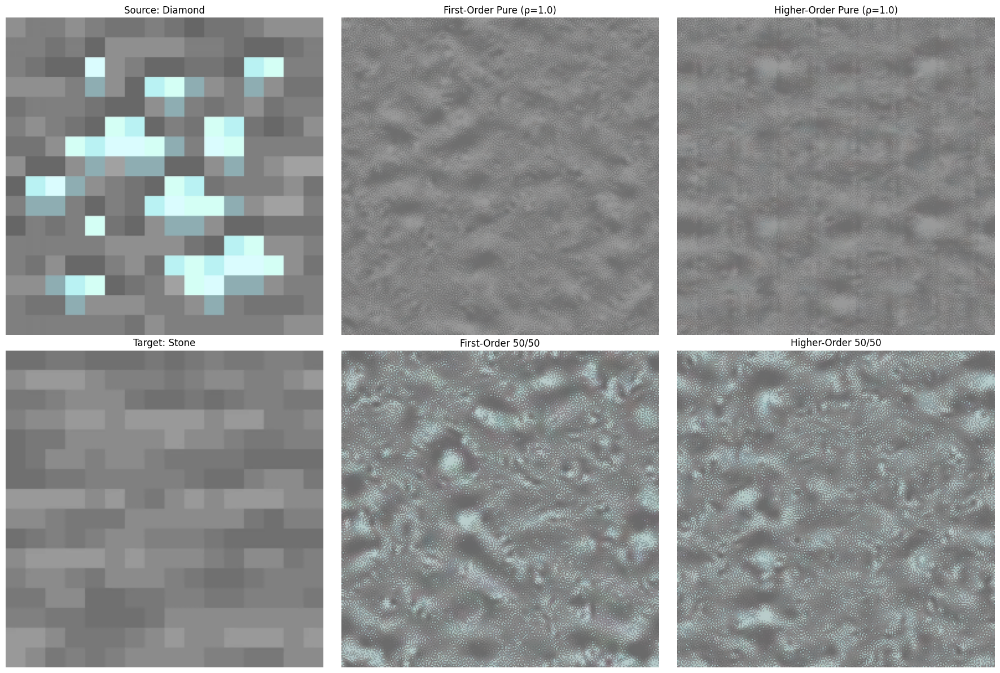

In [9]:
# Higher-Order: Pure stone (1.0)
print("Higher-Order: Diamond → Stone (Pure)")
diamond_stone_higher_pure = higher_order_texture_mixing(
    [diamond, stone],
    np.array([0.0, 1.0]),
    device=device,
    block_size=16,
    verbose=False
)

# Higher-Order: 50/50 blend
print("Higher-Order: Diamond ↔ Stone (50/50)")
diamond_stone_higher_50 = higher_order_texture_mixing(
    [diamond, stone],
    np.array([0.5, 0.5]),
    device=device,
    block_size=16,
    verbose=False
)

# Save higher-order results
output_dir = "../output/experiment_5_diamond_to_stone_comparison"
cv.imwrite(f"{output_dir}/higher_order_pure_stone.png", cv.cvtColor(diamond_stone_higher_pure, cv.COLOR_RGB2BGR))
cv.imwrite(f"{output_dir}/higher_order_50_50.png", cv.cvtColor(diamond_stone_higher_50, cv.COLOR_RGB2BGR))
print(f"Higher-order results saved to {output_dir}")

# Display comparison of both methods
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes[0, 0].imshow(diamond)
axes[0, 0].set_title("Source: Diamond")
axes[0, 0].axis('off')
axes[0, 1].imshow(diamond_stone_first_pure)
axes[0, 1].set_title("First-Order Pure (ρ=1.0)")
axes[0, 1].axis('off')
axes[0, 2].imshow(diamond_stone_higher_pure)
axes[0, 2].set_title("Higher-Order Pure (ρ=1.0)")
axes[0, 2].axis('off')
axes[1, 0].imshow(stone)
axes[1, 0].set_title("Target: Stone")
axes[1, 0].axis('off')
axes[1, 1].imshow(diamond_stone_first_50)
axes[1, 1].set_title("First-Order 50/50")
axes[1, 1].axis('off')
axes[1, 2].imshow(diamond_stone_higher_50)
axes[1, 2].set_title("Higher-Order 50/50")
axes[1, 2].axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/comparison_both_methods.png", dpi=150, bbox_inches='tight')
plt.show()


## Experiment 6: Color Space Comparison (First-Order)

Compare texture mixing in different color spaces: RGB, LAB, and YUV. Test 50/50 marble mixing to see how different color spaces affect the result.

In [10]:
# RGB: Mix all 3 channels
print("=== RGB Color Space ===")
marble_rgb = first_order_texture_mixing(
    [brick, marble_2],
    np.array([0.5, 0.5]),
    device=device,
    color_space=ColorSpace.RGB,
    verbose=True
)

output_dir = "../output/experiment_6_color_space_comparison"
os.makedirs(output_dir, exist_ok=True)
cv.imwrite(f"{output_dir}/rgb_50_50.png", cv.cvtColor(marble_rgb, cv.COLOR_RGB2BGR))
print(f"RGB result saved\n")

=== RGB Color Space ===
Mixing in RGB color space
Mixing channels: ['R', 'G', 'B']
Computing steerable pyramids for 2 textures of size 256x256...
  Pyramid decomposition complete (0.12s)
  14 total subbands (12 oriented bands)

Computing coefficient barycenters on GPU...
  Processed 5/12 oriented subbands
  Processed 10/12 oriented subbands
  Coefficient barycenters complete (93.70s)

Computing pixel barycenter on GPU...
  Pixel barycenter complete (5.86s)

Starting iterative synthesis (10 iterations)...
  Iteration 1/10 complete (13.25s)
  Iteration 2/10 complete (13.49s)
  Iteration 3/10 complete (14.16s)
  Iteration 4/10 complete (16.52s)
  Iteration 5/10 complete (19.02s)
  Iteration 6/10 complete (16.83s)
  Iteration 7/10 complete (19.91s)
  Iteration 8/10 complete (12.19s)
  Iteration 9/10 complete (11.68s)
  Iteration 10/10 complete (11.22s)

Synthesis complete!
RGB result saved



In [11]:
# LAB: Mix only L (lightness), preserve a,b (color)
print("=== LAB Color Space ===")
marble_lab = first_order_texture_mixing(
    [brick, marble_2],
    np.array([0.5, 0.5]),
    device=device,
    color_space=ColorSpace.LAB,
    verbose=True
)

cv.imwrite(f"{output_dir}/lab_50_50.png", cv.cvtColor(marble_lab, cv.COLOR_RGB2BGR))
print(f"LAB result saved\n")

=== LAB Color Space ===
Mixing in LAB color space
Mixing channels: ['L']
Computing steerable pyramids for 2 textures of size 256x256...
  Pyramid decomposition complete (0.03s)
  14 total subbands (12 oriented bands)

Computing coefficient barycenters on GPU...
  Processed 5/12 oriented subbands
  Processed 5/12 oriented subbands
  Processed 10/12 oriented subbands
  Processed 10/12 oriented subbands
  Coefficient barycenters complete (51.53s)

Computing pixel barycenter on GPU...
  Coefficient barycenters complete (51.53s)

Computing pixel barycenter on GPU...
  Pixel barycenter complete (5.15s)

Starting iterative synthesis (10 iterations)...
  Pixel barycenter complete (5.15s)

Starting iterative synthesis (10 iterations)...
  Iteration 1/10 complete (11.51s)
  Iteration 1/10 complete (11.51s)
  Iteration 2/10 complete (11.40s)
  Iteration 2/10 complete (11.40s)
  Iteration 3/10 complete (11.78s)
  Iteration 3/10 complete (11.78s)
  Iteration 4/10 complete (12.39s)
  Iteration 4/10 

In [12]:
# YUV: Mix only Y (luminance), preserve U,V (chrominance)
print("=== YUV Color Space ===")
marble_yuv = first_order_texture_mixing(
    [brick, marble_2],
    np.array([0.5, 0.5]),
    device=device,
    color_space=ColorSpace.YUV,
    verbose=True
)

cv.imwrite(f"{output_dir}/yuv_50_50.png", cv.cvtColor(marble_yuv, cv.COLOR_RGB2BGR))
print(f"YUV result saved\n")

=== YUV Color Space ===
Mixing in YUV color space
Mixing channels: ['Y']
Computing steerable pyramids for 2 textures of size 256x256...
  Pyramid decomposition complete (0.04s)
  14 total subbands (12 oriented bands)

Computing coefficient barycenters on GPU...
  Processed 5/12 oriented subbands
  Processed 5/12 oriented subbands
  Processed 10/12 oriented subbands
  Processed 10/12 oriented subbands
  Coefficient barycenters complete (60.41s)

Computing pixel barycenter on GPU...
  Coefficient barycenters complete (60.41s)

Computing pixel barycenter on GPU...
  Pixel barycenter complete (7.13s)

Starting iterative synthesis (10 iterations)...
  Pixel barycenter complete (7.13s)

Starting iterative synthesis (10 iterations)...
  Iteration 1/10 complete (13.11s)
  Iteration 1/10 complete (13.11s)
  Iteration 2/10 complete (11.85s)
  Iteration 2/10 complete (11.85s)
  Iteration 3/10 complete (11.23s)
  Iteration 3/10 complete (11.23s)
  Iteration 4/10 complete (11.19s)
  Iteration 4/10 

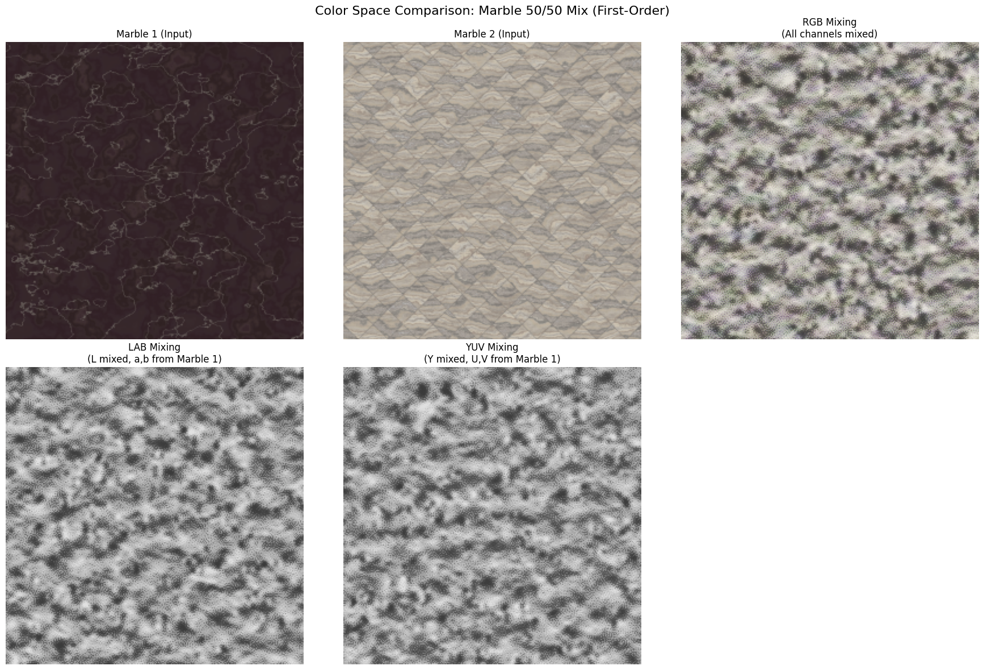

In [13]:
# Display all results for comparison
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Top row: Input textures and RGB result
axes[0, 0].imshow(marble_1)
axes[0, 0].set_title("Marble 1 (Input)")
axes[0, 0].axis('off')

axes[0, 1].imshow(marble_2)
axes[0, 1].set_title("Marble 2 (Input)")
axes[0, 1].axis('off')

axes[0, 2].imshow(marble_rgb)
axes[0, 2].set_title("RGB Mixing\n(All channels mixed)")
axes[0, 2].axis('off')

# Bottom row: LAB and YUV results
axes[1, 0].imshow(marble_lab)
axes[1, 0].set_title("LAB Mixing\n(L mixed, a,b from Marble 1)")
axes[1, 0].axis('off')

axes[1, 1].imshow(marble_yuv)
axes[1, 1].set_title("YUV Mixing\n(Y mixed, U,V from Marble 1)")
axes[1, 1].axis('off')

axes[1, 2].axis('off')

plt.suptitle("Color Space Comparison: Marble 50/50 Mix (First-Order)", fontsize=16)
plt.tight_layout()
plt.savefig(f"{output_dir}/color_space_comparison.png", dpi=150, bbox_inches='tight')
plt.show()
